# Geospatial analysis

Installations, imports and setup

In [ ]:
!pip install pandana folium matplotlib mapclassify osmnx

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import matplotlib.pyplot as plt
import seaborn as sns
import pandana
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

In [ ]:
# Clone git repository
! git clone https://github.com/Ggenoni/Geospatial_analysis_and_representation.git
# Change directory
%cd Geospatial_analysis_and_representation/data

Cloning into 'Geospatial_analysis_and_representation'...
remote: Enumerating objects: 29, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 29 (delta 4), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (29/29), 3.17 MiB | 10.01 MiB/s, done.
Resolving deltas: 100% (4/4), done.


### Circoscrizioni

In [107]:
# Step 1: Load the GeoJSON file
circoscrizioni = gpd.read_file("circoscrizioni.geojson")

In [108]:
# Step 2: Check the current coordinate reference system (CRS)
print("Current CRS:", circoscrizioni.crs)

Current CRS: EPSG:25832


In [109]:
# Step 3: Reproject to WGS84
if circoscrizioni.crs != "EPSG:32632":
    circoscrizioni = circoscrizioni.to_crs("EPSG:32632")
    print("Reprojected to:", circoscrizioni.crs)

Reprojected to: EPSG:32632


In [110]:
circoscrizioni

,numero_circ,area,perimetro,nome,fumetto,geometry
0,2,15712181,17850,MEANO,Circoscrizione n. 2 - MEANO,"POLYGON ((666651.786 5109264.903, 666650.353 5..."
1,3,36949609,38485,BONDONE,Circoscrizione n. 3 - BONDONE,"POLYGON ((660741.737 5109007.135, 660757.283 5..."
2,4,8663138,16403,SARDAGNA,Circoscrizione n. 4 - SARDAGNA,"POLYGON ((661627.54 5104968.137, 661632.747 51..."
3,6,13199398,20575,ARGENTARIO,Circoscrizione n. 6 - ARGENTARIO,"POLYGON ((667907.213 5105334.453, 667905.638 5..."
4,11,3073349,10962,S.GIUSEPPE-S.CHIARA,Circoscrizione n. 11 - S.GIUSEPPE-S.CHIARA,"POLYGON ((663312.544 5102745.129, 663330.224 5..."
5,7,15433274,18464,POVO,Circoscrizione n. 7 - POVO,"POLYGON ((669072.179 5099653.356, 668637.088 5..."
6,5,16687779,27197,RAVINA-ROMAGNANO,Circoscrizione n. 5 - RAVINA-ROMAGNANO,"POLYGON ((663871.728 5094972.066, 663852.148 5..."
7,8,16409555,24413,MATTARELLO,Circoscrizione n. 8 - MATTARELLO,"POLYGON ((663871.728 5094972.066, 663875.878 5..."
8,9,7342864,15395,VILLAZZANO,Circoscrizione n. 9 - VILLAZZANO,"POLYGON ((666987.471 5098181.576, 666974.784 5..."
9,10,6962104,15418,OLTREFERSINA,Circoscrizione n. 10 - OLTREFERSINA,"POLYGON ((663813.095 5101039.248, 663813.095 5..."


Circoscrizione n. 10 - OLTREFERSINA


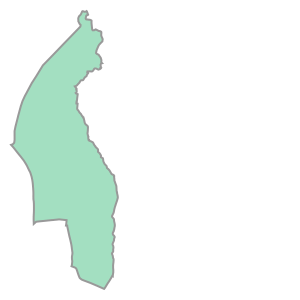

In [144]:
print(circoscrizioni.fumetto[9])
circoscrizioni.geometry[9]

In [200]:
circoscrizioni.explore(
    column="nome",
    tooltip="fumetto",
    cmap="tab20",
    legend=True,
    style_kwds={"color": "black", "weight": 1.5, "fillOpacity": 0.75}
)


In [159]:
circoscrizioni["city"] = "Trento"
trento = circoscrizioni[["city", "geometry"]]
trento = trento.dissolve(by= "city")
trento

,geometry
city,
Trento,"POLYGON ((663839.988 5094989.926, 663838.711 5..."


In [160]:
trento.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

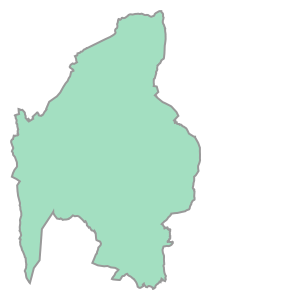

In [161]:
trento.geometry.values[0]

In [196]:
trento.explore(tiles="OpenTopoMap")

### Elevation contours

In [ ]:
# Load isoipse data
isoipsa = gpd.read_file("isoipsa.geojson").to_crs(epsg=32632)

In [178]:
isoipsa

,length,tipo,dxf_elevat,descrizion,simbolo,fumetto,geometry
0,21.36660,1.08.01,1380.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (660600.549 5101460.185, 660614.519..."
1,2.07404,1.08.01,1520.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (656786.444 5100883.196, 656786.534..."
2,15.40140,1.09.01,950.0,Linee invisibili per la continuit… di curve di...,0,Curva di livello direttrice,"LINESTRING (661522.018 5100883.548, 661527.508..."
3,10.08750,1.08.01,920.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (661800.572 5100822.987, 661796.412..."
4,10.43210,1.08.01,1290.0,Curva di livello direttrice (equidistanza 10 m...,104,Curva di livello direttrice,"LINESTRING (657173.213 5100480.19, 657171.813 ..."
...,...,...,...,...,...,...,...
68673,28.81340,1.09.01,210.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (663687.999 5100358.591, 663688.585..."
68674,13.04440,1.09.01,200.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (665030.982 5101871.338, 665030.853..."
68675,1.58984,1.09.01,190.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (664476.972 5101634.255, 664476.971..."
68676,13.74200,1.09.01,190.0,Linea invisibile per la continuita di curve di...,0,Curva di livello direttrice,"LINESTRING (664616.936 5100142.856, 664616.002..."


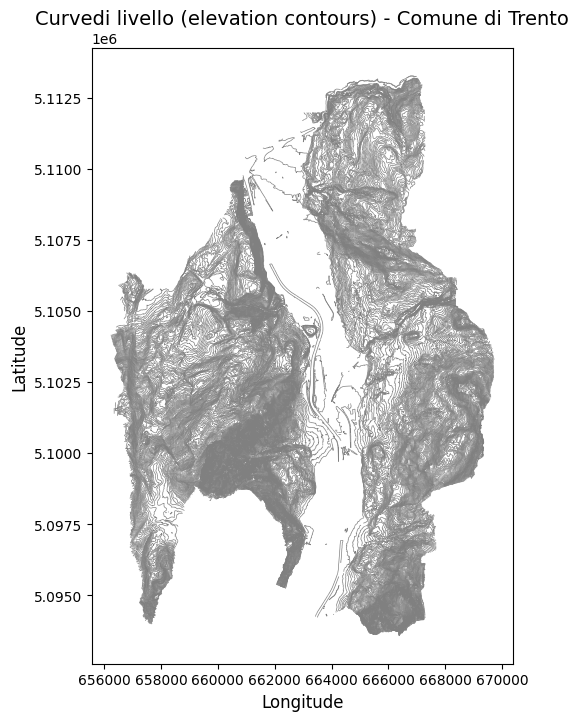

In [176]:
plt.rcdefaults()
# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot isoipse
isoipsa.plot(ax=ax, color="gray", linewidth=0.5)

# Set title and labels
ax.set_title("Curvedi livello (elevation contours) - Comune di Trento", fontsize=14)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# Force Matplotlib to show ticks
#ax.tick_params(axis="both", which="both", direction="in", length=5)

plt.show()

In [182]:
circoscrizioni= circoscrizioni.to_crs("EPSG:32632")

In [183]:
circoscrizioni.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [184]:
isoipsa.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

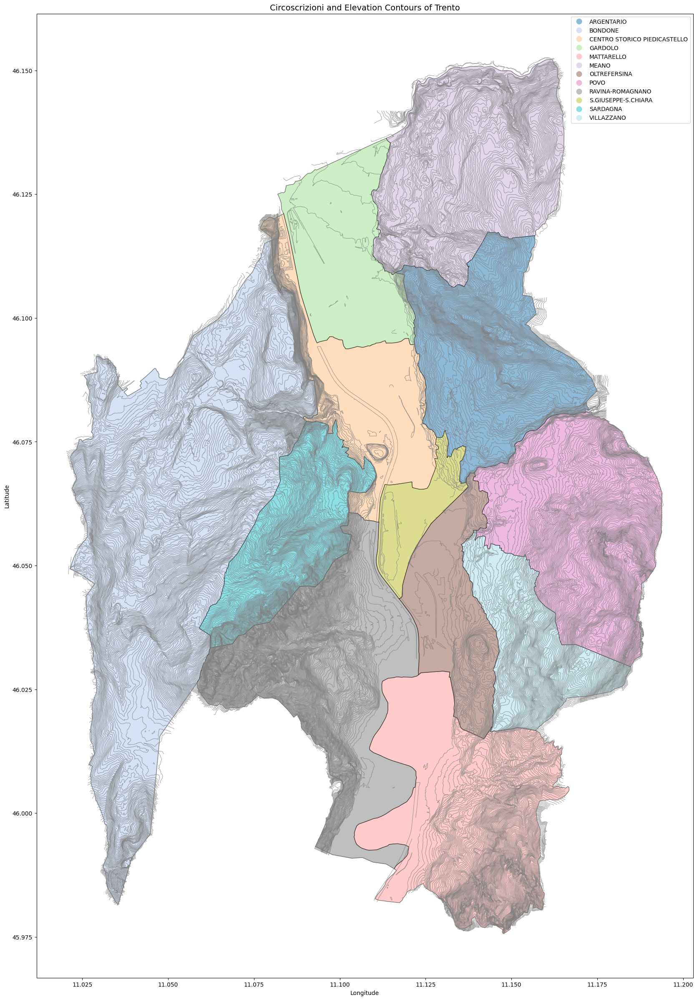

In [191]:
# Create plot
fig, ax = plt.subplots(figsize=(30, 30))

# Use a larger categorical colormap
circoscrizioni.plot(ax=ax, column="nome", cmap="tab20", edgecolor="black", alpha=0.5, legend=True)

# Overlay the elevation contours (isoipse)
isoipsa.plot(ax=ax, color="gray", linewidth=0.8, alpha=0.7)

# Add labels and title
plt.title("Circoscrizioni and Elevation Contours of Trento", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()


In [ ]:
#Use this if needed

# Reproject to WGS 84 (EPSG:4326) if needed
if circoscrizioni.crs != "EPSG:4326":
    circoscrizioni = circoscrizioni.to_crs("EPSG:4326")

# Merge all geometries into a single polygon if necessary
polygon = circoscrizioni.union_all()
polygon

In [ ]:
# Reproject to WGS 84 (EPSG:4326) if needed
if trento.crs != "EPSG:4326":
    trento = trento.to_crs("EPSG:4326")
polygon = trento.geometry.iloc[0]
polygon

In [163]:
# Get the walking network within the city boundary
graph = ox.graph_from_polygon(polygon_from_dissolve, network_type="walk")

In [164]:
#?????
crs = "EPSG:32632"
graph = ox.projection.project_graph(graph, to_crs=crs)

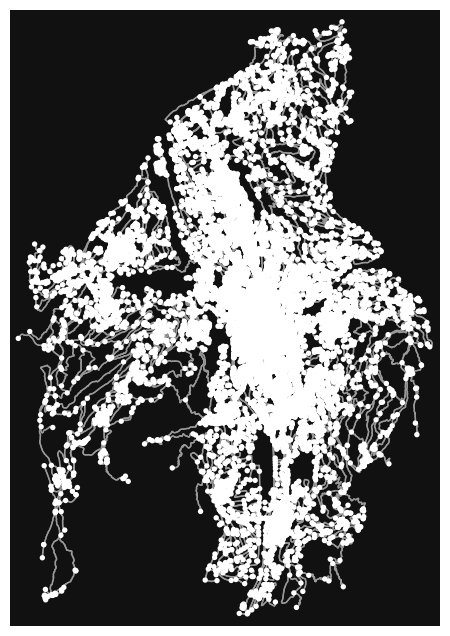

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [165]:
ox.plot_graph(graph)

In [13]:
graph_simplified = ox.simplification.consolidate_intersections(
    # Graph to simplify
    graph,
    # buffer around each node (project the graph beforehand)
    tolerance=5,
    # Get result as graph (False to get nodes only as gdf)
    rebuild_graph=True,
    # no dead ends
    dead_ends=False,
    # Reconnect (False to get intersections only)
    reconnect_edges=True
)

In [14]:
nodes, edges = ox.graph_to_gdfs(graph)
nodes_s, edges_s = ox.graph_to_gdfs(graph_simplified)

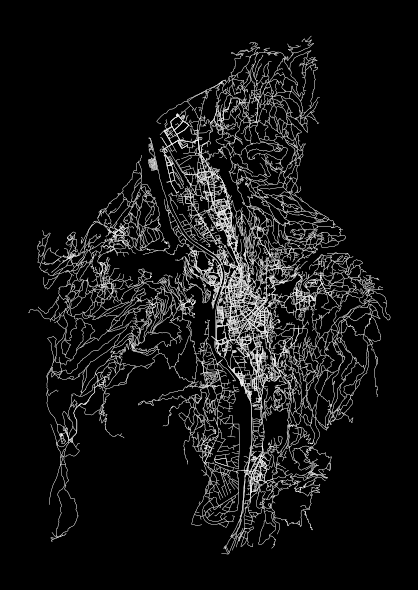

In [15]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot data
edges.plot(
    ax=ax,
    color='white',
    linewidth=0.2
)

# Tight layout
plt.tight_layout()

In [ ]:
print(edges.crs)


EPSG:32632


In [ ]:
xmin, ymin, xmax, ymax = edges.total_bounds
print(f"Bounding box of edges: xmin={xmin}, xmax={xmax}, ymin={ymin}, ymax={ymax}")


Bounding box of edges: xmin=656503.367753312, xmax=669746.0956551728, ymin=5094236.523220613, ymax=5113189.632449756


In [ ]:
xmin_s, ymin_s, xmax_s, ymax_s = edges_s.total_bounds
print(f"Bounding box of edges: xmin={xmin_s}, xmax={xmax_s}, ymin={ymin_s}, ymax={ymax_s}")


Bounding box of edges: xmin=656503.367753312, xmax=669746.0956551728, ymin=5094244.970973965, ymax=5113047.544250995


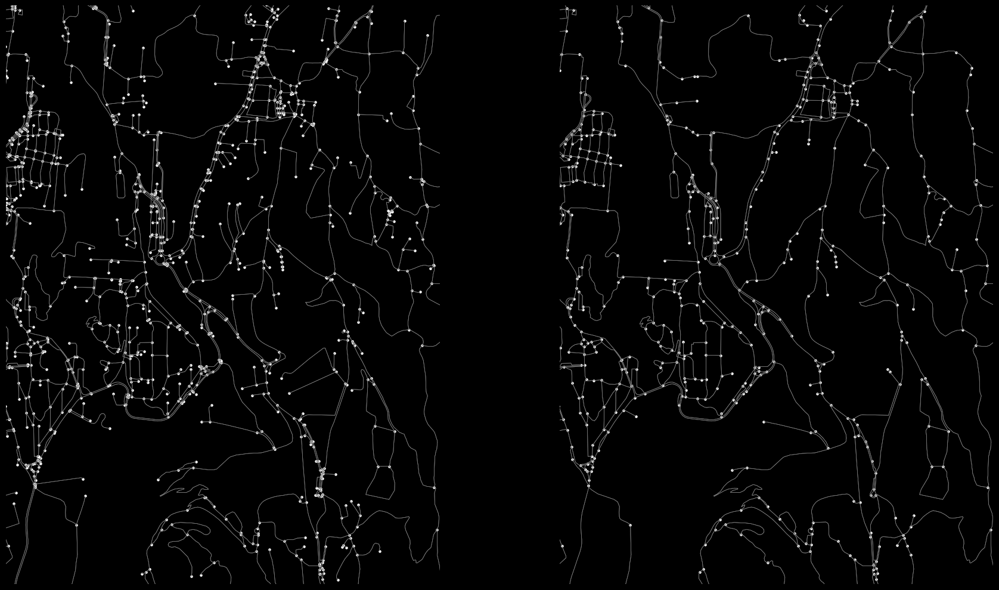

In [16]:
# Define colors
edgecol = [0.5,0.5,0.5]
nodecol = 'white'
linewidth = 0.5
markersize = 5

# Setup plot
fig, ax = plt.subplots(ncols=2, figsize=(20,10))
ax[0].set_axis_off()
ax[1].set_axis_off()
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
fig.set_facecolor('black')

# Plot original graph
edges.plot(ax=ax[0], color=edgecol, linewidth=linewidth)
nodes.plot(ax=ax[0], color=nodecol, markersize=markersize)

# Plot simplified graph
edges_s.plot(ax=ax[1], color=edgecol, linewidth=linewidth)
nodes_s.plot(ax=ax[1], color=nodecol, markersize=markersize)

# Zoom in
plt.setp(ax[0], xlim=(665000, 666500), ylim=(5100000, 5102000))
plt.setp(ax[1], xlim=(665000, 666500), ylim=(5100000, 5102000))

# Tight layout
plt.tight_layout()

In [17]:
# Print info
print(
    'number of nodes:\n\noriginal graph: '+str(len(nodes))
    +'\nsimplified graph: '+str(len(nodes_s))
)

number of nodes:

original graph: 20306
simplified graph: 9955


Using vmax: 19.91


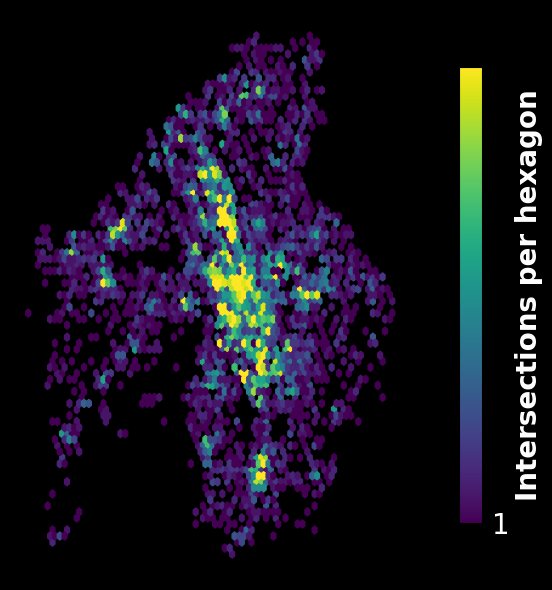

In [18]:
# Set all text color to white
COLOR = 'white'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

vmax_value = nodes_s.shape[0] / 500  # Adjust divisor to control max density range
hb = ax.hexbin(
    x=nodes_s['x'],
    y=nodes_s['y'],
    gridsize=75,
    cmap='viridis',
    mincnt=1,
    vmax=vmax_value,  # Dynamically adjust max value
)
print(f"Using vmax: {vmax_value}")


# Colorbar
cb = plt.colorbar(hb, ax=ax, shrink=0.8, ticks=[1, 20, 40, 60, 80, 100])
cb.ax.tick_params(color='none', labelsize=20)
cb.ax.set_yticklabels(['1', '20', '40', '60', '80', '>= 100'])
cb.set_label('Intersections per hexagon', fontsize=20, fontweight='bold')

# Tight layout
plt.tight_layout()

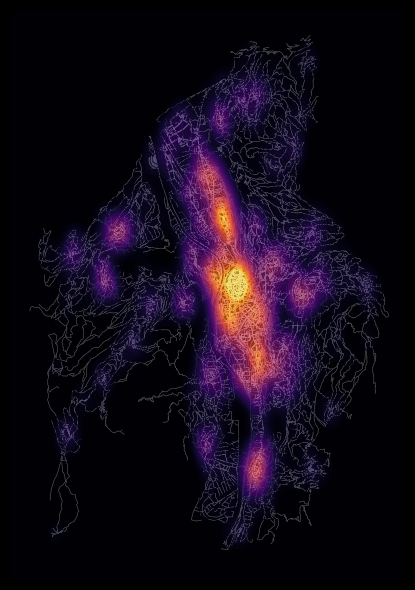

In [19]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot streets underneath
edges.plot(ax=ax, color=[1,1,1], linewidth=0.3, zorder=0)

# Plot KDE on top
sns.kdeplot(
    ax=ax,
    data=nodes_s,
    x='x', y='y',
    hue=None,
    fill=True,
    cmap='inferno',  # Stronger contrast
    thresh=0,
    levels=30,  # More contour levels
    alpha=0.7,  # Slightly less transparency
    zorder=10,
    bw_adjust=0.5  # More detailed density
)

# Tight layout
plt.tight_layout()


In [ ]:
# Select points of interest based on osm tags
tags = {
    'amenity':[
        'cafe',
        'bar',
        'pub',
        'restaurant'
    ],
    'shop':[
        'bakery',
        'convenience',
        'supermarket',
        'mall',
        'department_store',
        'clothes',
        'fashion',
        'shoes'
    ],
    'leisure':[
        'fitness_centre'
    ]
}

# Get amentities from place
#pois = ox.geometries.geometries_from_place(polygon, tags=tags)



# Get POIs from OSM
pois = ox.features_from_polygon(polygon, tags)
# Project pois
pois = pois.to_crs(epsg=32632)

                                         geometry addr:housenumber  \
element id                                                           
node    247887464  POINT (665525.458 5104255.221)               13   
        248051531  POINT (665465.587 5104127.425)               27   
        259973562  POINT (665396.468 5108452.823)                2   
        268401562  POINT (664033.084 5103759.573)               40   
        268401567  POINT (664114.589 5103764.327)                1   

                  addr:postcode             addr:street     amenity  \
element id                                                            
node    247887464   38121-38123  Via degli Alberti Poja  restaurant   
        248051531           NaN         Via per Cognola         NaN   
        259973562           NaN         Via del Lavaron  restaurant   
        268401562         38122        Piazza del Duomo        cafe   
        268401567         38122       Piazza Mario Pasi        cafe   

           

<Axes: >

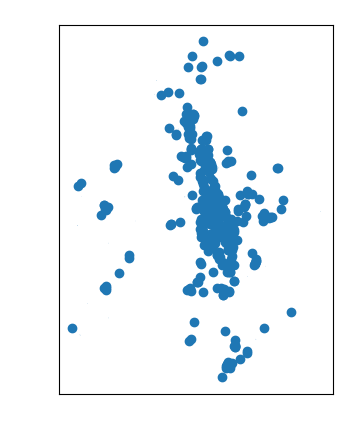

In [ ]:

# Display first few POIs
print(pois.head())

# Plot POIs
pois.plot()

In [ ]:
# Max time to walk in minutes (no routing to nodes further than this)
walk_time = 15

# Walking speed
walk_speed = 4.5

# Set a uniform walking speed on every edge
for u, v, data in graph.edges(data=True):
    data['speed_kph'] = walk_speed
graph = ox.add_edge_travel_times(graph)

# Extract node/edge GeoDataFrames, retaining only necessary columns (for pandana)
nodes = ox.graph_to_gdfs(graph, edges=False)[['x', 'y']]
edges = ox.graph_to_gdfs(graph, nodes=False).reset_index()[['u', 'v', 'travel_time']]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 20.4 MB/s eta 0:00:00


In [ ]:
# Construct the pandana network model
network = pandana.Network(
    node_x=nodes['x'],
    node_y=nodes['y'],
    edge_from=edges['u'],
    edge_to=edges['v'],
    edge_weights=edges[['travel_time']]
)

# Extract centroids from the pois' geometries
centroids = pois.centroid

In [ ]:
# Specify a max travel distance for analysis
# Minutes -> seconds
maxdist = walk_time * 60

# Set the pois' locations on the network
network.set_pois(
    category='pois',
    maxdist=maxdist,
    maxitems=10,
    x_col=centroids.x,
    y_col=centroids.y
)

In [ ]:
# calculate travel time to 10 nearest pois from each node in network
distances = network.nearest_pois(
    distance=maxdist,
    category='pois',
    num_pois=10
)

distances.astype(int).head()

,1,2,3,4,5,6,7,8,9,10
osmid,,,,,,,,,,
9191982,332,481,494,524,545,569,681,724,724,734
9013746935,336,486,498,528,550,574,686,728,728,739
2454602411,378,448,478,527,591,615,727,770,770,780
9013746938,307,457,518,521,544,548,656,699,699,710
9192420,783,872,885,900,900,900,900,900,900,900


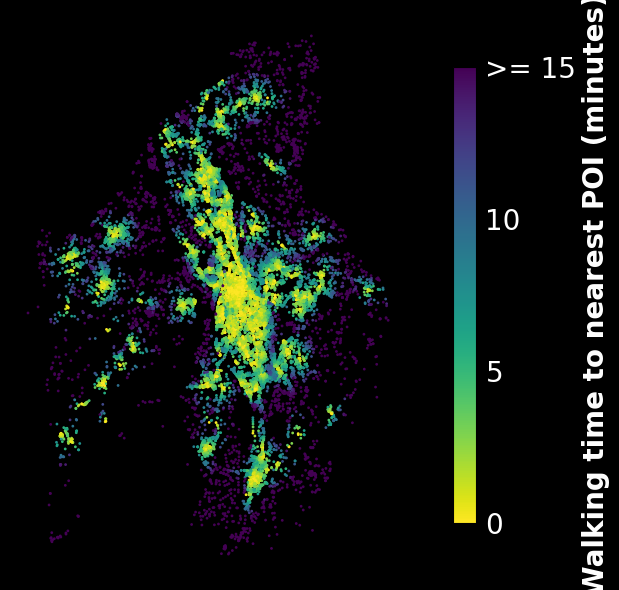

In [ ]:
# Set text parameters
COLOR = 'white'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor((0,0,0))

# Plot distance to nearest POI
sc = ax.scatter(
    x=nodes['x'],
    y=nodes['y'],
    c=distances[1],
    s=1,
    cmap='viridis_r',
)

# Colorbar
cb = fig.colorbar(sc, ax=ax, shrink=0.8, ticks=[0, 300, 600, 900])
cb.ax.tick_params(color='none', labelsize=20)
cb.ax.set_yticklabels(['0', '5', '10', '>= 15'])
cb.set_label('Walking time to nearest POI (minutes)', fontsize=20, fontweight='bold')

# Remove empty space
plt.tight_layout()

<ipython-input-76-6b9317228b87>:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


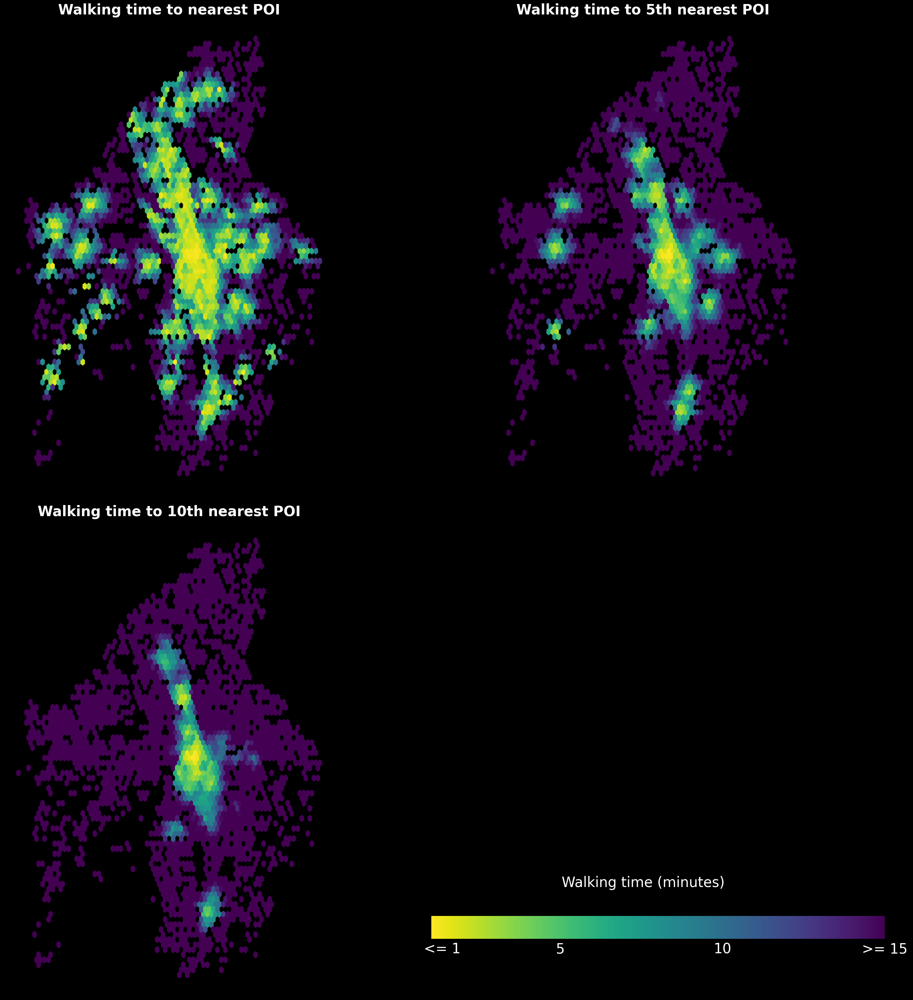

In [ ]:
# Setup plot
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(30,30), constrained_layout=False)
ax[0][0].set_axis_off()
ax[0][1].set_axis_off()
ax[1][0].set_axis_off()
ax[1][1].set_axis_off()
ax[0][0].set_aspect('equal')
ax[0][1].set_aspect('equal')
ax[1][0].set_aspect('equal')

# Specify colors
fig.set_facecolor('black')
cmap = 'viridis_r'

# Plot distance to nearest POI
hb = ax[0][0].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[1],
    alpha=1
)

# Plot distance to 5th nearest POI
hb = ax[0][1].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[5],
    alpha=1
)

# Plot distance to 10th nearest POI
hb = ax[1][0].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[10],
    alpha=1
)

# Add titles to maps
ax[0][0].set_title('Walking time to nearest POI', fontsize=30, fontweight='bold')
ax[0][1].set_title('Walking time to 5th nearest POI', fontsize=30, fontweight='bold')
ax[1][0].set_title('Walking time to 10th nearest POI', fontsize=30, fontweight='bold')

# Setup color bar axis (location of color bar)
cbar_ax = fig.add_axes([0.5, 0.01, 0.5, 0.5])
cbar_ax.set_axis_off()

# Color bar properties
cb = plt.colorbar(
    hb,
    ax=cbar_ax,
    shrink=0.9,
    ticks=[82, 300, 600, 900],
    orientation='horizontal',
    aspect=20
)

cb.outline.set_edgecolor('none')
cb.ax.tick_params(color='none', labelsize=30)
cb.ax.set_xticklabels(['<= 1', '5', '10', '>= 15'])

# Title for color bar
ax[1][1].text(0.5, 0.23, 'Walking time (minutes)', fontsize=30, ha='center')

# Tight layout
plt.tight_layout()

In [85]:
# Extract elevation points
isoipsa['elevation'] = isoipsa['dxf_elevat'].astype(float)  # Convert to numeric
elevation_points = np.array([isoipsa.geometry.centroid.x, isoipsa.geometry.centroid.y, isoipsa['elevation']]).T

# Build KDTree for fast nearest neighbor search
tree = cKDTree(elevation_points[:, :2])

# Function to get elevation based on nearest contour line
def get_elevation(x, y):
    dist, idx = tree.query([x, y])
    return elevation_points[idx, 2]  # Return corresponding elevation

# Compute elevation at the midpoint of each edge
edges_s['mid_x'] = edges_s.geometry.apply(lambda g: g.interpolate(0.5, normalized=True).x)
edges_s['mid_y'] = edges_s.geometry.apply(lambda g: g.interpolate(0.5, normalized=True).y)
edges_s['elevation'] = edges_s.apply(lambda row: get_elevation(row.mid_x, row.mid_y), axis=1)


In [89]:
edges_s['elevation'].min()

178.83

In [90]:
edges_s['elevation'].max()

2170.0

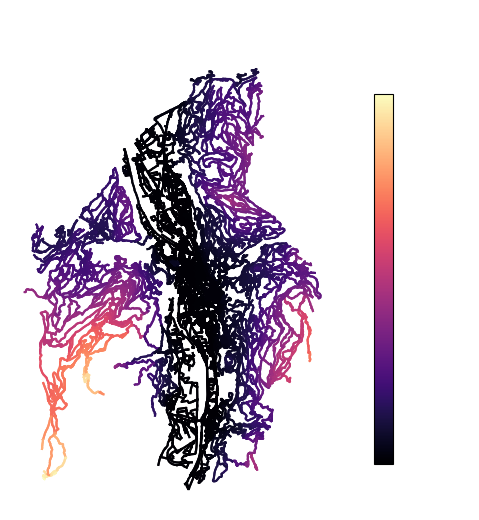

In [88]:

fig, ax = plt.subplots(figsize=(10, 6))
ax.set_axis_off()
ax.set_aspect("equal")

# Choose a better colormap
cmap = plt.cm.magma  # Try 'viridis', 'cividis', 'magma', etc.

# Normalize altitude values for color mapping
norm = mcolors.Normalize(vmin=edges_s['elevation'].min(), vmax=edges_s['elevation'].max())

# Plot each edge with color based on altitude
for _, row in edges_s.iterrows():
    ax.plot(*row.geometry.xy, color=cmap(norm(row.elevation)), linewidth=1.5)

# Add colorbar with units
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, shrink=0.8)
cbar.set_label("Elevation (m)", fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.title("Street Network by Elevation (m)", fontsize=14)
plt.show()


In [104]:
sidewalk_tags = {
    "highway": [
        "footway",       # Dedicated pedestrian paths
        "path",          # General paths, may allow bikes/horses
        "pedestrian",    # Pedestrian-only streets
        "sidewalk",      # Explicitly mapped sidewalks
        "track",         # Sometimes used for pedestrian access
        "living_street"  # Streets where pedestrians have priority
    ],
    "footway": [
        "sidewalk",      # Sidewalks explicitly mapped
        "crossing"       # Pedestrian crossings
    ],
    "surface": [
        "paved", "asphalt", "concrete", "compacted", "paving_stones", "gravel"
    ],
    "lit": True,         # Check if the path has lighting (for safety)
    "width": True,       # Get width data if available
    "incline": True,     # Important for slope analysis
    "smoothness": True,  # Helps assess walkability for people with disabilities
}


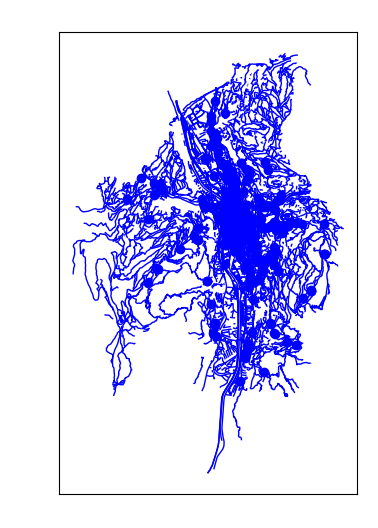

In [105]:
# Define specific sidewalk-related OSM tags
#sidewalk_tags = {"highway": ["footway", "path", "pedestrian", "sidewalk"]}

# Get sidewalk geometries from OSM
sidewalks = ox.features_from_polygon(polygon, sidewalk_tags)

# Reproject to match your analysis CRS
sidewalks = sidewalks.to_crs(epsg=32632)

# Plot to check
fig, ax = plt.subplots(figsize=(10, 6))
sidewalks.plot(ax=ax, color="blue", linewidth=1)
plt.title("Extracted Sidewalk Network")
plt.show()


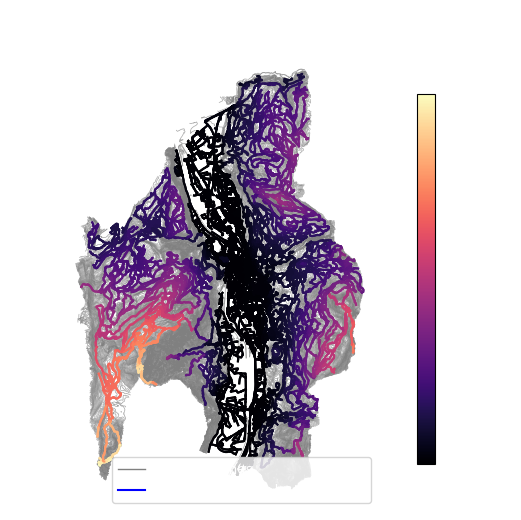

In [102]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_axis_off()
ax.set_aspect("equal")

# Plot isoipse (contour lines)
isoipsa.plot(ax=ax, color="gray", linewidth=0.5, alpha=0.7, label="Contour Lines")

# Choose a better colormap
cmap = plt.cm.magma  # Try 'viridis',cividis, 'magma', etc.
norm = mcolors.Normalize(vmin=edges_s['elevation'].min(), vmax=edges_s['elevation'].max())

# Plot each sidewalk edge with color based on altitude
for _, row in edges_s.iterrows():
    ax.plot(*row.geometry.xy, color=cmap(norm(row.elevation)), linewidth=1.5)

# Add colorbar with explicit tick labels in meters
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, shrink=0.8)
cbar.set_label("Elevation (m)", fontsize=14)
cbar.ax.tick_params(labelsize=12)

# Fix legend: manually add entries
legend_elements = [
    Line2D([0], [0], color="gray", lw=1, label="Contour Lines"),
    Line2D([0], [0], color="blue", lw=1.5, label="Sidewalks (color by elevation)"),
]
ax.legend(handles=legend_elements, loc="lower right")

plt.title("Sidewalk Network Over Elevation Contours", fontsize=14)
plt.show()


### Bikeability

<Figure size 1200x800 with 0 Axes>

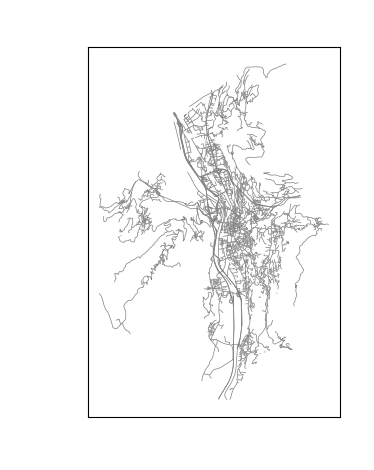

In [139]:
gdf_bike = gpd.read_file("piste_ciclabili.geojson")
gdf_bike = gdf_street.to_crs("EPSG:32632")
# Plot piste ciclabili
plt.figure(figsize=(12, 8))
gdf_bike.plot(color="gray", linewidth=0.5)
plt.title("Piste ciclabili - Comune di Trento")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
!apt-get install gdal-bin

In [ ]:
!wget https://osmit-estratti.wmcloud.org/output/pbf/comuni/022205_Trento.osm.pbf
!ogr2ogr -f "GPKG" trento.gpkg 022205_Trento.osm.pbf

In [ ]:
from pyogrio import list_layers
list_layers('trento.gpkg')
lines = gpd.read_file("trento.gpkg",layer="lines")
lines.highway.unique()


In [ ]:
cycling_roads = lines[lines.highway.isin(['cycleway'])]
cycling_roads.plot()
plt.show()

<Axes: >

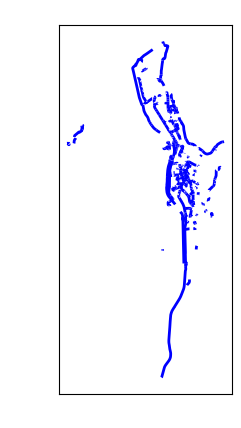

In [ ]:
import geopandas as gpd
import networkx as nx
import osmnx as ox

# Load bike lane data from trento.gpkg
gdf_bike = gpd.read_file("trento.gpkg", layer="lines")
gdf_bike = gdf_bike[gdf_bike.highway.isin(['cycleway'])]

# Convert to a projected CRS for network analysis
gdf_bike = gdf_bike.to_crs(epsg=32632)  # UTM zone 32N (for Trento)

# Plot to check
gdf_bike.plot(color="blue", linewidth=2)


In [ ]:
import osmnx as ox
import networkx as nx
from shapely.geometry import LineString

# Create a new graph
G = nx.Graph()

# Add edges from the bike lane dataset
for idx, row in gdf_bike.iterrows():
    line = row.geometry
    if isinstance(line, LineString):  # Ensure it's a line
        coords = list(line.coords)
        for i in range(len(coords) - 1):
            node1, node2 = coords[i], coords[i+1]
            G.add_edge(node1, node2, length=line.length)

# Convert to an OSMnx MultiDiGraph for analysis
G_osmnx = ox.graph_from_gdfs(gdf_nodes=None, gdf_edges=gdf_bike)


AttributeError: 'NoneType' object has no attribute 'columns'

In [ ]:
custom_filter = (
    '["highway"~"cycleway|path|primary|secondary|tertiary|residential"]'
    '["bicycle"~"yes|designated"]["surface"!~"unpaved|gravel"]'
)


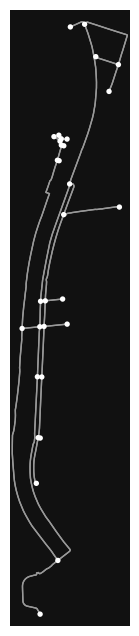

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
# Get only dedicated cycling infrastructure
graph_bike_lanes = ox.graph_from_polygon(polygon, custom_filter=custom_filter)
ox.plot_graph(graph_bike_lanes)

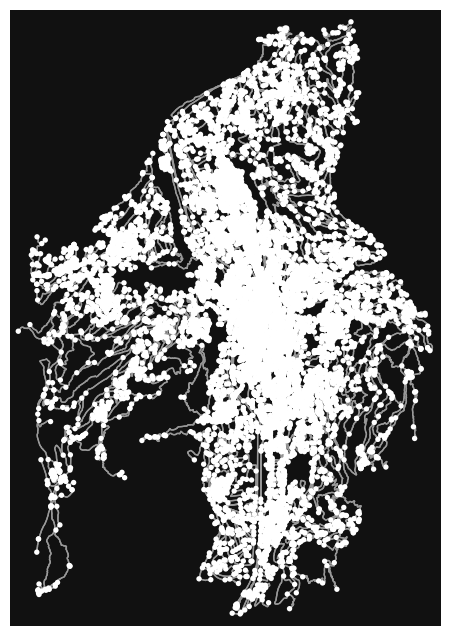

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
graph_bike = ox.graph_from_polygon(polygon, network_type="bike")
ox.plot_graph(graph_bike)


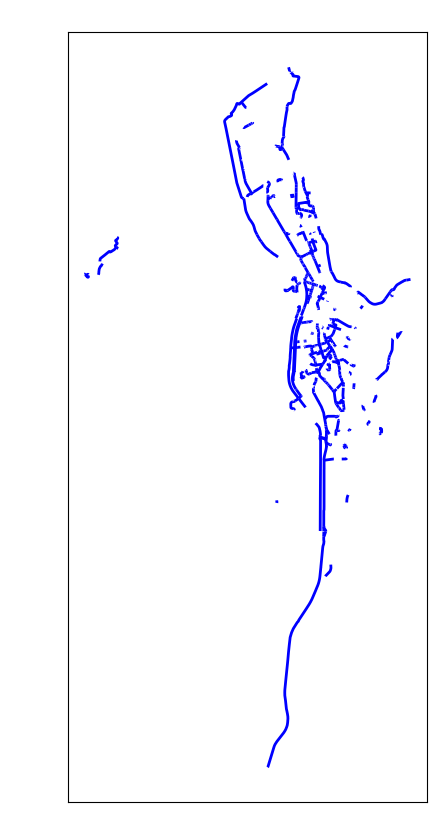

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the "lines" layer (contains roads & bike paths)
gdf = gpd.read_file("trento.gpkg", layer="lines")

# Filter for bike lanes based on OSM tags
gdf_bike = gdf[gdf["highway"].isin(["cycleway"])]
#gdf_bike = gdf_bike[gdf_bike.get("bicycle", "no") != "no"]  # Remove non-bike paths

# Plot bike lanes
fig, ax = plt.subplots(figsize=(10, 10))
gdf_bike.plot(ax=ax, color="blue", linewidth=2)
plt.title("Bike Lanes in Trento (From GPKG)")
plt.show()


In [ ]:
gdf_bike

,osm_id,name,highway,waterway,aerialway,barrier,man_made,railway,z_order,other_tags,geometry
103,23734003,None,cycleway,None,None,None,None,None,0,"""bicycle""=>""designated"",""check_date:surface""=>...","LINESTRING (11.12807 46.06993, 11.12796 46.06994)"
443,24479805,Viale Trieste,cycleway,None,None,None,None,None,10,"""bicycle""=>""designated"",""foot""=>""designated"",""...","LINESTRING (11.13573 46.06496, 11.13578 46.064..."
470,24615889,Ciclovia della Valle dell'Adige,cycleway,None,None,None,None,None,20,"""bicycle""=>""designated"",""bridge""=>""yes"",""foot""...","LINESTRING (11.11023 46.13471, 11.10984 46.13573)"
524,24744101,None,cycleway,None,None,None,None,None,0,"""bicycle""=>""designated"",""foot""=>""designated"",""...","LINESTRING (11.13879 46.07092, 11.13858 46.070..."
551,24772518,None,cycleway,None,None,None,None,None,0,"""bicycle""=>""designated"",""foot""=>""designated"",""...","LINESTRING (11.12432 46.05621, 11.12432 46.056..."
...,...,...,...,...,...,...,...,...,...,...,...
30571,1329340222,None,cycleway,None,None,None,None,None,0,"""bicycle""=>""designated"",""surface""=>""asphalt""","LINESTRING (11.12911 46.06697, 11.12892 46.067..."
30834,1352984356,None,cycleway,None,None,None,None,None,0,"""bicycle""=>""designated"",""crossing:island""=>""ye...","LINESTRING (11.12709 46.059, 11.12707 46.05901)"
30835,1352984357,None,cycleway,None,None,None,None,None,0,"""bicycle""=>""designated"",""crossing:island""=>""ye...","LINESTRING (11.12702 46.05906, 11.12701 46.05907)"
30836,1352984581,None,cycleway,None,None,None,None,None,0,"""bicycle""=>""designated"",""crossing:island""=>""ye...","LINESTRING (11.12707 46.05901, 11.12705 46.05903)"


In [ ]:
from shapely.geometry import Point

nodes = set()
for line in gdf_bike.geometry:
    if line.geom_type == "LineString":
        nodes.add(Point(line.coords[0]))  # Start node
        nodes.add(Point(line.coords[-1]))  # End node

In [ ]:
# Convert nodes to a GeoDataFrame
gdf_nodes = gpd.GeoDataFrame(geometry=list(nodes), crs=gdf_bike.crs)
gdf_nodes["x"] = gdf_nodes.geometry.x
gdf_nodes["y"] = gdf_nodes.geometry.y
gdf_nodes["osmid"] = range(len(gdf_nodes))  # Unique node IDs


In [ ]:
def find_nearest_node(point):
    return gdf_nodes.distance(point).idxmin()

In [ ]:
gdf_bike["u"] = gdf_bike.geometry.apply(lambda line: find_nearest_node(Point(line.coords[0])))
gdf_bike["v"] = gdf_bike.geometry.apply(lambda line: find_nearest_node(Point(line.coords[-1])))


<ipython-input-58-f8481d1cb94a>:2: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  return gdf_nodes.distance(point).idxmin()
<ipython-input-58-f8481d1cb94a>:2: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  return gdf_nodes.distance(point).idxmin()
<ipython-input-58-f8481d1cb94a>:2: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  return gdf_nodes.distance(point).idxmin()
<ipython-input-58-f8481d1cb94a>:2: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this 

KeyboardInterrupt: 

In [ ]:
G_bike = ox.graph_from_gdfs(gdf_nodes=None, gdf_edges=gdf_bike)

AttributeError: 'NoneType' object has no attribute 'columns'

In [ ]:
import osmnx as ox
import geopandas as gpd
import networkx as nx
import matplotlib.pyplot as plt

# 1️⃣ Load the "lines" layer (contains roads & bike paths)
gdf = gpd.read_file("trento.gpkg", layer="lines")

# 2️⃣ Filter for dedicated bike lanes
gdf_bike = gdf[gdf["highway"].isin(["cycleway"])]
#gdf_bike = gdf_bike[gdf_bike.get("bicycle", "no") != "no"]  # Ensure it's bike-accessible

# 3️⃣ Convert bike lanes into an OSMnx graph (Nodes + Edges)
# Convert the GeoDataFrame into an undirected NetworkX graph


# 4️⃣ Get the existing OSMnx street network
cityname = "Trento, Italy"
polygon = ox.geocode_to_gdf(cityname).geometry[0]  # Get the city boundary
G_osm = ox.graph_from_polygon(polygon, network_type="bike")

# 5️⃣ Merge the two graphs (Trento GPKG bike lanes + OSMnx network)
G_merged = nx.compose(G_osm, G_bike)

# 6️⃣ Plot the merged graph
fig, ax = plt.subplots(figsize=(10, 10))
ox.plot_graph(G_merged, ax=ax, node_size=0, edge_linewidth=0.7, edge_color="blue")
plt.title("Merged Bike Lane Network: OSMnx + Trento GPKG")
plt.show()
